In [5]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset,DataLoader
import matplotlib.pyplot as plt

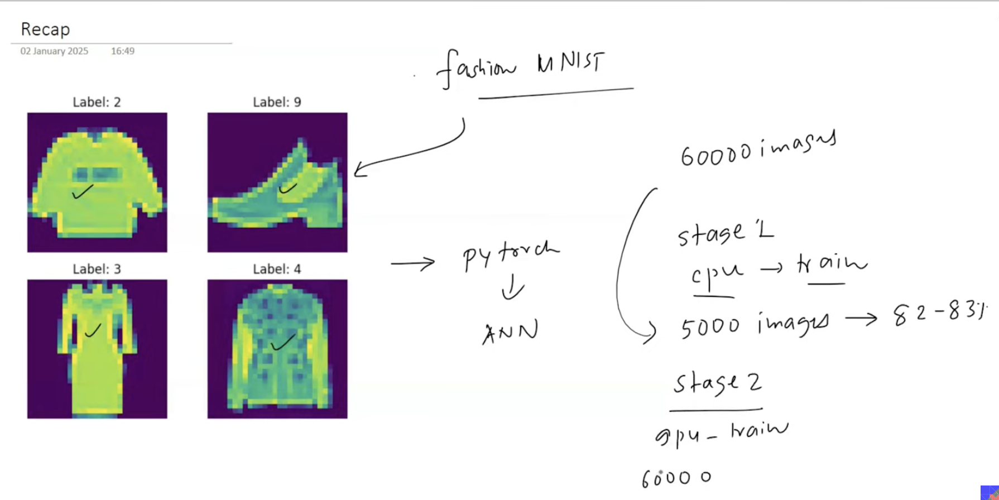

In [6]:
## setting the seed for reproducibility
torch.manual_seed(42)

In [7]:
import torch
device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"device:{device}")

device:cuda


In [8]:
df=pd.read_csv('/content/fashion-mnist_train.csv')
df.head()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,6,0,0,0,0,0,0,0,5,0,...,0,0,0,30,43,0,0,0,0,0
3,0,0,0,0,1,2,0,0,0,0,...,3,0,0,0,0,1,0,0,0,0
4,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
df.shape

(60000, 785)

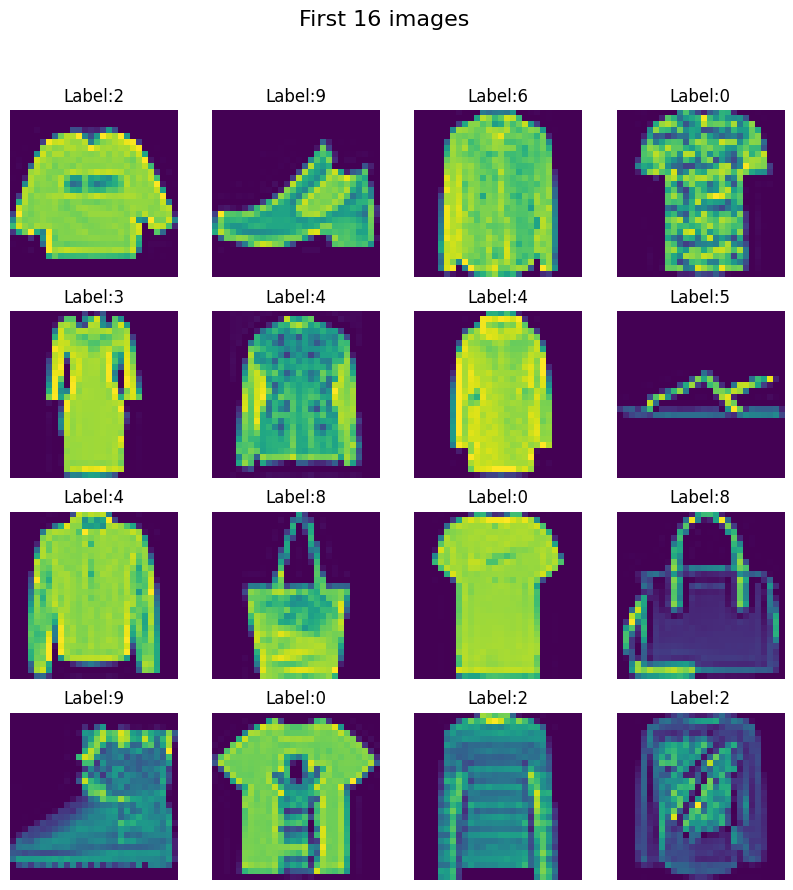

In [10]:
## create a 4X4 grid of images

fig,axes=plt.subplots(4,4,figsize=(10,10))
plt.suptitle('First 16 images',fontsize=16)

for i,ax in enumerate(axes.flat):
  img=df.iloc[i,1:].values.reshape(28,28)
  ax.imshow(img)
  ax.set_title(f"Label:{df.iloc[i,0]}")
  ax.axis('off')

plt.show()

In [11]:
X=df.iloc[:,1:].values
y=df.iloc[:,0].values

In [12]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [13]:
X_train=X_train/255.0
X_test=X_test/255.0

In [14]:
class CustomDataset(Dataset):
  def __init__(self,features,labels):
    self.features=torch.tensor(features,dtype=torch.float32)
    self.labels=torch.tensor(labels,dtype=torch.long)

  def __len__(self):
    return len(self.features)

  def __getitem__(self,idx):
    return self.features[idx],self.labels[idx]

train_dataset=CustomDataset(X_train,y_train)
test_dataset=CustomDataset(X_test,y_test)

In [15]:
train_loader=DataLoader(train_dataset,shuffle=True,batch_size=32)
test_loader=DataLoader(test_dataset,shuffle=False,batch_size=32)

In [16]:
len(train_loader)

1500

In [17]:
class ANN(nn.Module):
  def __init__(self,num_features):
    super().__init__()
    self.model=nn.Sequential(
        nn.Linear(num_features,128),
        nn.ReLU(),
        nn.Linear(128,64),
        nn.ReLU(),
        nn.Linear(64,10),
    )

  def forward(self,X):
    out=self.model(X)
    return out

learning_rate=0.1
epochs=100



In [18]:
model=ANN(X_train.shape[1])
model=model.to(device)  ## moving the model to gpu

In [19]:
loss_fn=nn.CrossEntropyLoss()
optimizer=torch.optim.SGD(model.parameters(),lr=learning_rate)
for epoch in range(epochs):
  total_epoch_loss=0

  for batch_features,batch_labels in train_loader:

    batch_features,batch_labels=batch_features.to(device),batch_labels.to(device)
    outputs=model(batch_features)
    loss=loss_fn(outputs,batch_labels)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    total_epoch_loss=total_epoch_loss+loss.item()
  avg_loss=total_epoch_loss/len(train_loader)
  print(f"Epoch:{epoch+1},Loss:{avg_loss}")

Epoch:1,Loss:0.6352872474888961
Epoch:2,Loss:0.4304986953884363
Epoch:3,Loss:0.3861262078657746
Epoch:4,Loss:0.3584607255011797
Epoch:5,Loss:0.3376494748592377
Epoch:6,Loss:0.32276468626906474
Epoch:7,Loss:0.3078539018382629
Epoch:8,Loss:0.2949818898836772
Epoch:9,Loss:0.2854692505300045
Epoch:10,Loss:0.27467058210571604
Epoch:11,Loss:0.26830569267148774
Epoch:12,Loss:0.2581421597401301
Epoch:13,Loss:0.24940819991752505
Epoch:14,Loss:0.24444738873218497
Epoch:15,Loss:0.2385919222868979
Epoch:16,Loss:0.23155899402375021
Epoch:17,Loss:0.22562562982489665
Epoch:18,Loss:0.2202964697740972
Epoch:19,Loss:0.21206334652379155
Epoch:20,Loss:0.20960091769819458
Epoch:21,Loss:0.20624992956593632
Epoch:22,Loss:0.19986103242821993
Epoch:23,Loss:0.1953041393881043
Epoch:24,Loss:0.19312163671137145
Epoch:25,Loss:0.18764107141271233
Epoch:26,Loss:0.18366442496639987
Epoch:27,Loss:0.18018299543857574
Epoch:28,Loss:0.17326497477230926
Epoch:29,Loss:0.17048049322267372
Epoch:30,Loss:0.17044167463853954
E

In [20]:
model.eval()
total=0
correct=0
with torch.no_grad():
  for batch_features,batch_labels in test_loader:
    batch_features,batch_labels=batch_features.to(device),batch_labels.to(device)
    outputs=model(batch_features)
    _,predicted=torch.max(outputs,axis=1) ## we get the indices
    total=total+batch_labels.shape[0]
    correct=correct+(predicted==batch_labels).sum().item()
print(correct/total)

0.8898333333333334


In [21]:
## evaulating on training data
total=0
correct=0
with torch.no_grad():
  for batch_features,batch_labels in train_loader:
    batch_features,batch_labels=batch_features.to(device),batch_labels.to(device)
    outputs=model(batch_features)
    _,predicted=torch.max(outputs,axis=1) ## we get the indices
    total=total+batch_labels.shape[0]
    correct=correct+(predicted==batch_labels).sum().item()
print(correct/total)

0.9824791666666667


## The Problem


Accuracy on test day- 88%

Accuracy on training data- 98%

Huge gap of 10 percent means there is overfitting

We need to reduce the overfitting

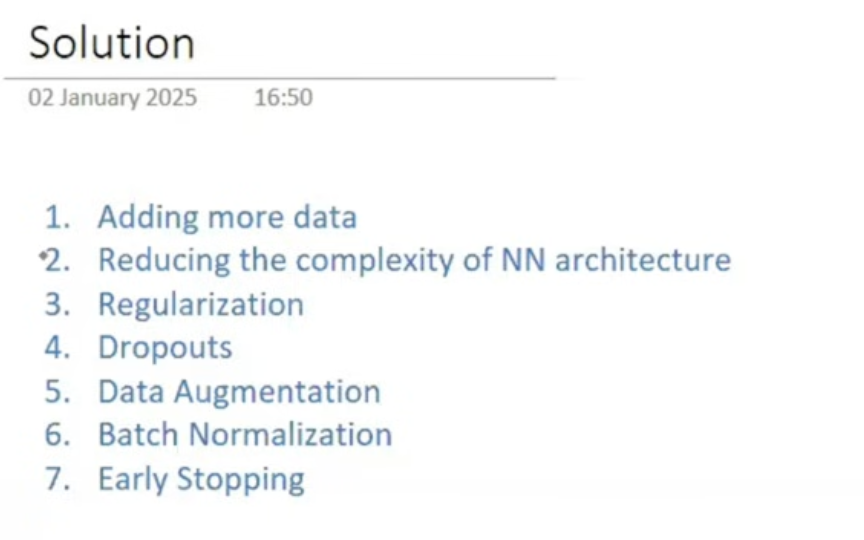

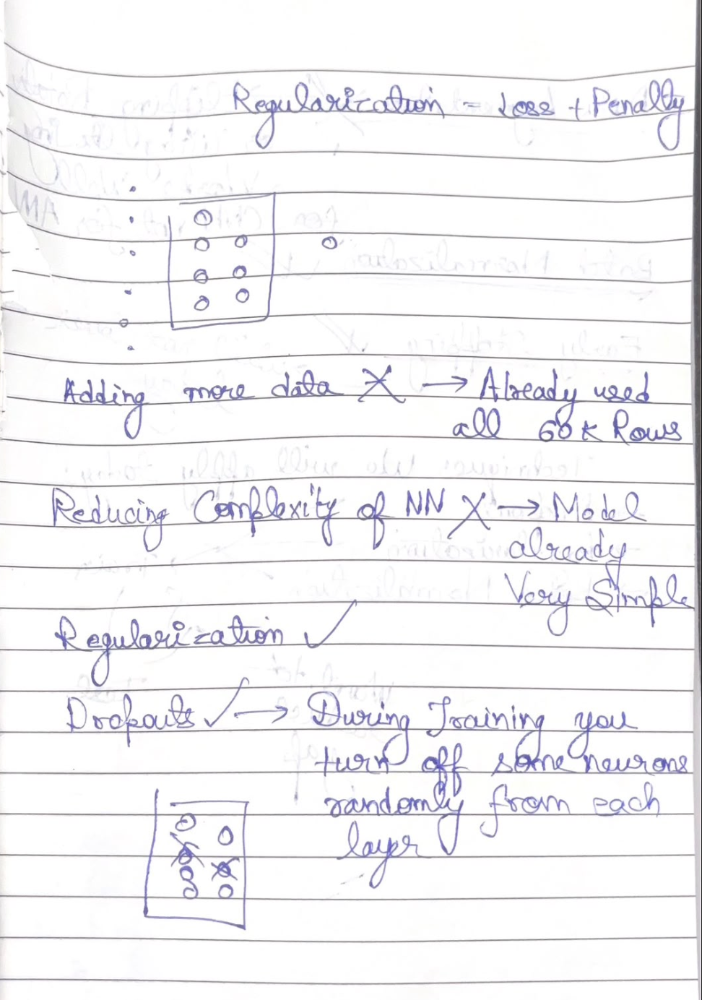

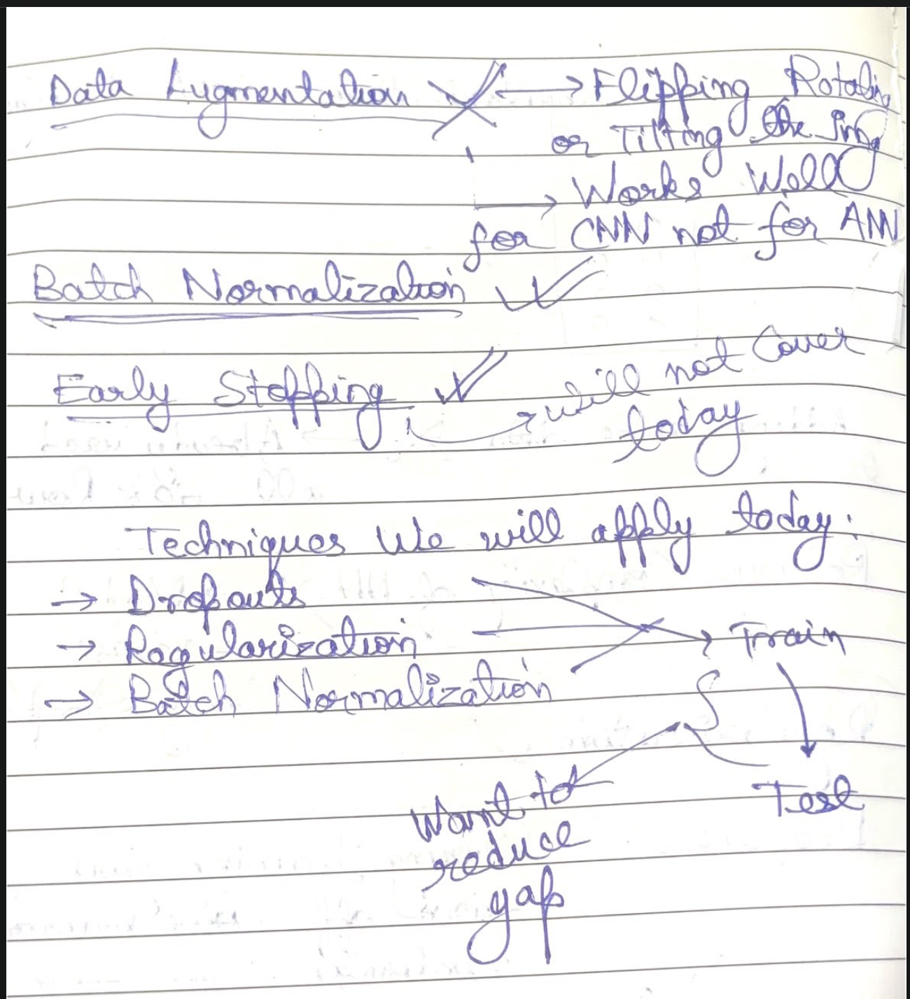

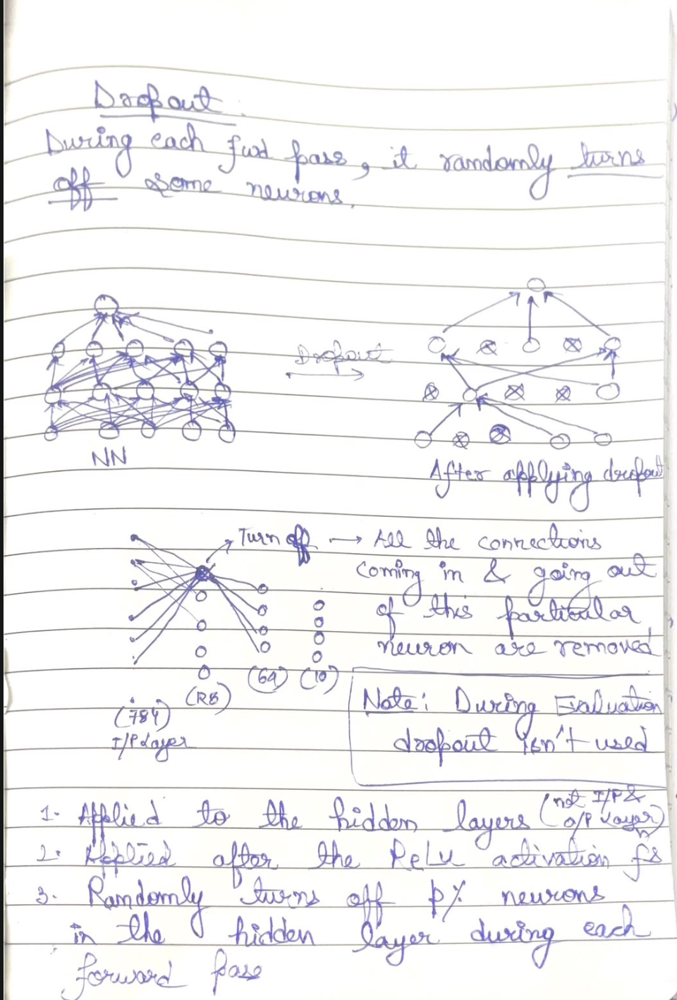

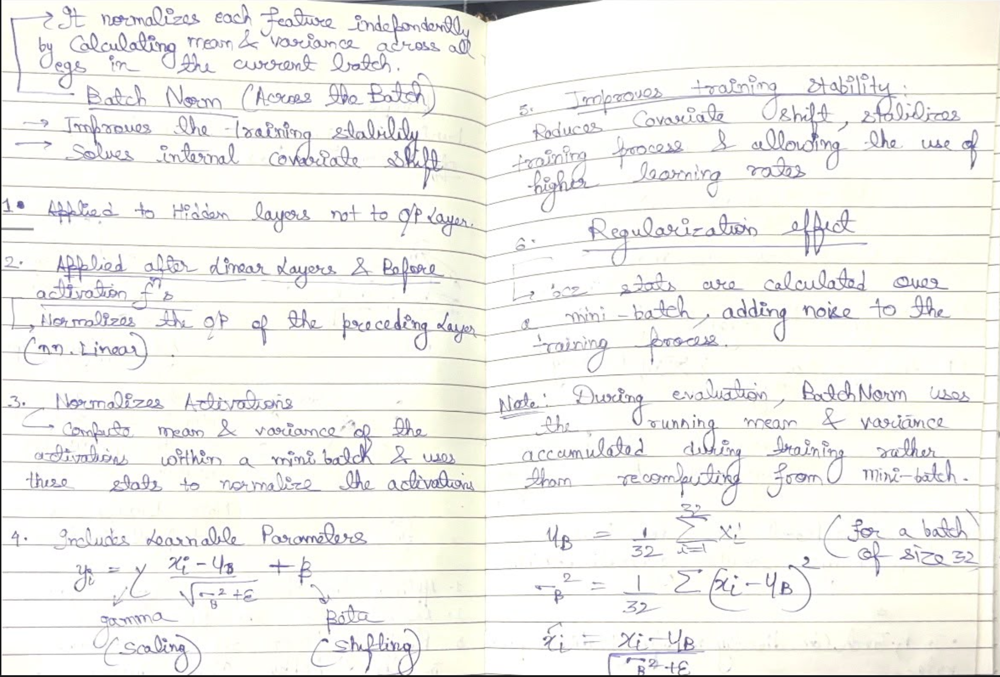

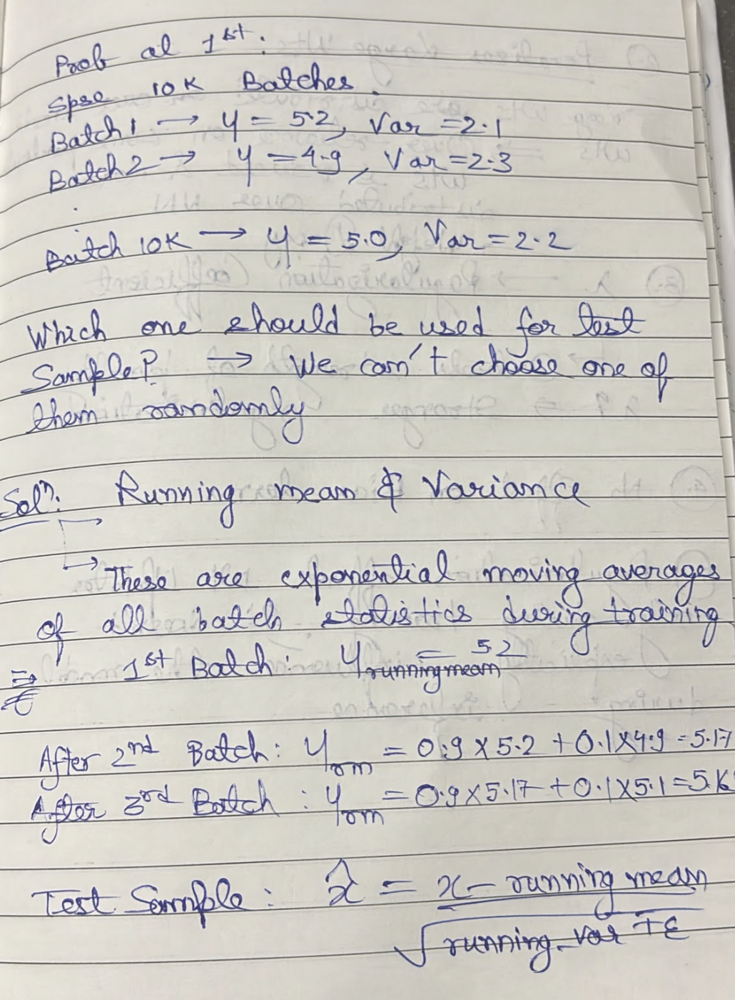

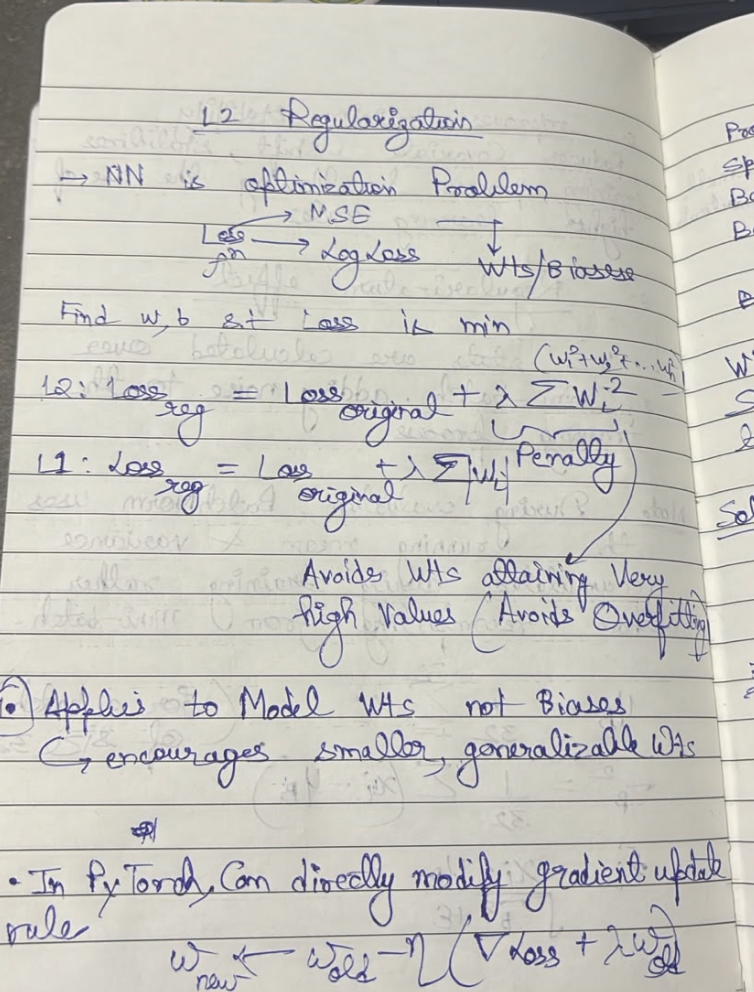

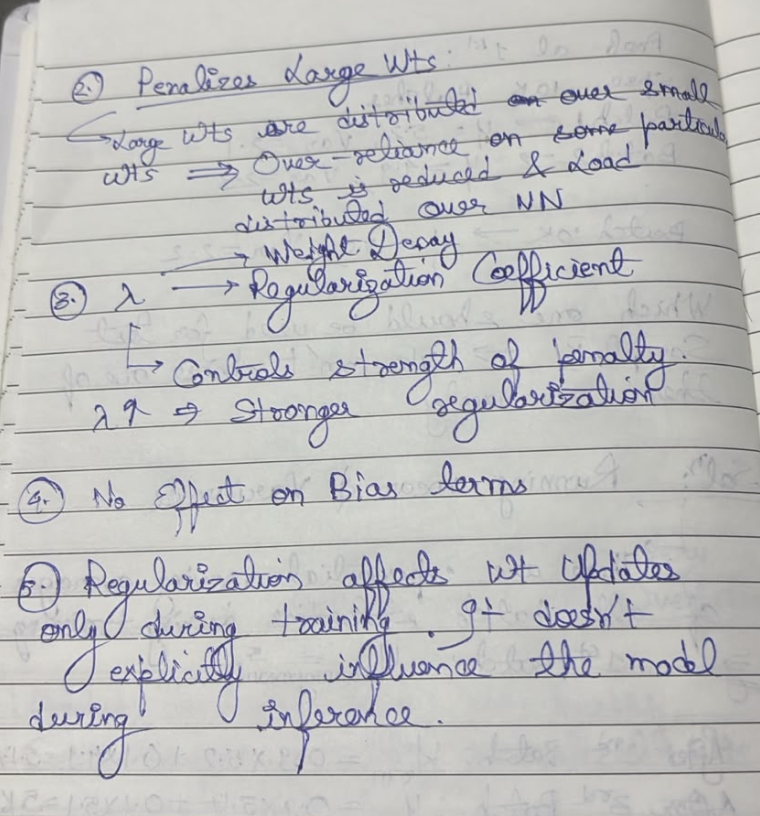

In [29]:
class NN(nn.Module):

  def __init__(self,num_features):
    super().__init__()
    self.model=nn.Sequential(
        nn.Linear(num_features,128),
        nn.BatchNorm1d(128), ## Applying Batch Normalization just before ReLU activation
        nn.ReLU(),
        nn.Dropout(p=0.3), ## Applying Dropout just after ReLU activation
        nn.Linear(128,64),
        nn.BatchNorm1d(64), ## Applying Batch Normalization just before ReLU activation
        nn.ReLU(),
        nn.Dropout(p=0.3), ## Applying Dropout just after ReLU activation
        nn.Linear(64,10)
    )

  def forward(self,X):
    return self.model(X)



In [30]:
learning_rate=0.1
epochs=100

In [ ]:
model=NN(X_train.shape[1])
model.to(device)
loss_function=nn.CrossEntropyLoss()
optimizer=optim.SGD(model.parameters(),lr=learning_rate,weight_decay=1e-4) 
## Applying L2 regularization through weight_decay

In [32]:
for epoch in range(epochs):
  total_epoch_loss=0

  for batch_features,batch_labels in train_loader:

    batch_features,batch_labels=batch_features.to(device),batch_labels.to(device)
    outputs=model(batch_features)
    loss=loss_function(outputs,batch_labels) ## the loss gets divided by the batch size
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    total_epoch_loss=total_epoch_loss+loss.item()
  avg_loss=total_epoch_loss/len(train_loader) ## this loss gets divided by total no of batches
  print(f"Epoch:{epoch+1},Loss:{avg_loss}")

Epoch:1,Loss:0.6262655287881692
Epoch:2,Loss:0.49785045492649077
Epoch:3,Loss:0.457722856203715
Epoch:4,Loss:0.4315710692405701
Epoch:5,Loss:0.4142699181139469
Epoch:6,Loss:0.4033032285372416
Epoch:7,Loss:0.3927985606988271
Epoch:8,Loss:0.3809387469639381
Epoch:9,Loss:0.37791274147232373
Epoch:10,Loss:0.3662603703290224
Epoch:11,Loss:0.36010552880664665
Epoch:12,Loss:0.3524915538529555
Epoch:13,Loss:0.35106911677867175
Epoch:14,Loss:0.34836459177732465
Epoch:15,Loss:0.3416763823305567
Epoch:16,Loss:0.3437557648917039
Epoch:17,Loss:0.3338693931847811
Epoch:18,Loss:0.33094979254404705
Epoch:19,Loss:0.3288516573309898
Epoch:20,Loss:0.3276278788546721
Epoch:21,Loss:0.32670488342642784
Epoch:22,Loss:0.3219152413358291
Epoch:23,Loss:0.31814578324059645
Epoch:24,Loss:0.3171563980629047
Epoch:25,Loss:0.3117339788054426
Epoch:26,Loss:0.3117905701349179
Epoch:27,Loss:0.3100498540053765
Epoch:28,Loss:0.30808937169611456
Epoch:29,Loss:0.3045403604755799
Epoch:30,Loss:0.3058329184725881
Epoch:31,Lo

In [33]:
model.eval()
total=0
correct=0
with torch.no_grad():
  for batch_features,batch_labels in test_loader:
    batch_features,batch_labels=batch_features.to(device),batch_labels.to(device)
    outputs=model(batch_features)
    _,predicted=torch.max(outputs,axis=1) ## we get the indices
    total=total+batch_labels.shape[0]
    correct=correct+(predicted==batch_labels).sum().item()
print(correct/total)

0.8896666666666667


In [34]:
## evaulating on training data
total=0
correct=0
with torch.no_grad():
  for batch_features,batch_labels in train_loader:
    batch_features,batch_labels=batch_features.to(device),batch_labels.to(device)
    outputs=model(batch_features)
    _,predicted=torch.max(outputs,axis=1) ## we get the indices
    total=total+batch_labels.shape[0]
    correct=correct+(predicted==batch_labels).sum().item()
print(correct/total)

0.945625


In [ ]:
## test-> 88.9 % and train->94% therefore we reduced the overfitting